# Description

Here we teset tensor basis neural network on the 2-dimensional turbulence dataset.

# Import

In [1]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [2]:
dataset = 'kepsilon'

# Loading data - select which cases to include in the training/validation set (commented out cases are held out)
cases = ['DUCT_1100',
         'DUCT_1150',
         'DUCT_1250',
         'DUCT_1300',
         'DUCT_1350',
         'DUCT_1400',
         'DUCT_1500',
         'DUCT_1600',
         'DUCT_1800',
         #'DUCT_2000',
         'DUCT_2205',
         'DUCT_2400',
         'DUCT_2600',
         'DUCT_2900',
         'DUCT_3200',
         #'DUCT_3500',
         'PHLL_case_0p5',
         'PHLL_case_0p8',
         'PHLL_case_1p0',
         #'PHLL_case_1p2',
         'PHLL_case_1p5',
         'BUMP_h20',
         'BUMP_h26',
         'BUMP_h31',
         #'BUMP_h38',
         'BUMP_h42',
         'CNDV_12600',
         'CNDV_20580',
         'CBFS_13700'
         ]

In [3]:
#Convenient functions for loading dataset
def loadCombinedArray(cases,field):
    data = np.concatenate([np.load('../data/'+dataset+'/'+dataset+'_'+case+'_'+field + '.npy', allow_pickle=True) for case in cases])
    return data

In [4]:
def loadLabels(cases,field):
    data = np.concatenate([np.load('../data/'+'labels/'+case+'_'+field + '.npy') for case in cases])
    return data

In [5]:
print('Loading features and labels from the dataset: '+ dataset)

Loading features and labels from the dataset: kepsilon


In [6]:
#Load the set of ten basis tensors (N,10,3,3), from Pope "A more general effective-viscosity hypothesis" (1975).
Tensors = loadCombinedArray(cases,'Tensors')
print('Shape of basis tensor array: '+str(Tensors.shape))

Shape of basis tensor array: (791490, 10, 3, 3)


In [7]:
#Load the 47 invariants (N,47) used by Wu et al. "Physics-informed machine learning approach for augmenting turbulence models: A comprehensive framework" (2018)
Invariants = loadCombinedArray(cases,'I1')
print('Shape of invariant features array: '+str(Invariants.shape))

Shape of invariant features array: (791490, 47)


In [8]:
# #Load the additional scalars (N,5): 
# Scalars = loadCombinedArray(cases,'q')
# print('Shape of scalar features array: '+str(Scalars.shape))

In [9]:
Features = Invariants.copy()
print('Shape of combined features array: '+str(Features.shape))

Shape of combined features array: (791490, 47)


# Data processing

In [10]:
def remove_outliers(Features):
    stdev = np.std(Features,axis=0)
    means = np.mean(Features,axis=0)
    ind_drop = np.empty(0)
    for i in range(len(Features[0,:])):
        ind_drop = np.concatenate((ind_drop,np.where((Features[:,i]>means[i]+5*stdev[i]) | (Features[:,i]<means[i]-5*stdev[i]) )[0]))
    return ind_drop.astype(int)

outlier_removal_switch = 0
if outlier_removal_switch == 1:
    outlier_index = remove_outliers(Features)
    print('Found '+str(len(outlier_index))+' outliers in the input feature set')
    Features = np.delete(Features,outlier_index,axis=0)
    Tensors = np.delete(Tensors,outlier_index,axis=0)
    Labels = np.delete(Labels,outlier_index,axis=0)


In [11]:
#Load the label set from DNS/LES:
Labels = loadLabels(cases,'b')
#If desired, reshape the 3x3 symmetric anisotropy tensor into a 1x6 vector
# Labels = np.delete(Labels.reshape((len(Labels),9)),[3,6,7],axis=1)
print('Shape of DNS/LES labels array: '+str(Labels.shape))

Shape of DNS/LES labels array: (791490, 3, 3)


In [12]:
indices = np.arange(Features.shape[0])

In [13]:
x_train, x_val, y_train, y_val, ind_train, ind_val = train_test_split(Features, Labels, indices, test_size=0.2, random_state=10, shuffle=True)

In [14]:
basis_train = Tensors[ind_train]
basis_val = Tensors[ind_val]

In [15]:
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_val = scaler.transform(x_val)

In [16]:
print(' ')
print('Training features:')
print(x_train.shape)
print('Training tensor basis:')
print(basis_train.shape)
print('Training labels:')
print(y_train.shape)
print(' ')
print('Validation features:')
print(x_val.shape)
print('Validation tensor basis:')
print(basis_val.shape)
print('Validation labels:')
print(y_val.shape)
print(' ')

 
Training features:
(633192, 47)
Training tensor basis:
(633192, 10, 3, 3)
Training labels:
(633192, 3, 3)
 
Validation features:
(158298, 47)
Validation tensor basis:
(158298, 10, 3, 3)
Validation labels:
(158298, 3, 3)
 


# Tensor Basis Neural Network

In [17]:
input_features_num = Features.shape[1]
basis_tensors_num = basis_train.shape[1]
hidden_layers_num = 10
hidden_layer_size = 30

In [18]:
input_layer = layers.Input(shape=(input_features_num),  name='input_layer')
input_tensor_basis = layers.Input(shape=(basis_tensors_num, 3, 3), name='tensor_input_layer')
hidden = layers.Dense(hidden_layer_size,
                      name='hidden_layer_1',
                      kernel_initializer='lecun_normal',
                      kernel_regularizer=tf.keras.regularizers.l2(1E-3),
                      activation = "selu")(input_layer)
for i in range(2, hidden_layers_num+1):
    hidden = layers.Dense(hidden_layer_size,
                          name=f'hidden_layer_{i}',
                          kernel_initializer='lecun_normal',
                          kernel_regularizer=tf.keras.regularizers.l2(1E-3),
                          activation = "selu")(hidden)

gn = layers.Dense(basis_tensors_num,
                  name='gn',
                  kernel_initializer='lecun_normal',
                  kernel_regularizer=tf.keras.regularizers.l2(1E-3),
                  activation = "selu")(hidden)
shaped = layers.Reshape((basis_tensors_num, 1, 1), name='reshape_layer')(gn)
dot_prod_output = layers.Dot(axes=1, name='Dot_product')([shaped,input_tensor_basis])
output = layers.Reshape((3, 3), name='reshape_output')(dot_prod_output)

model = keras.Model(inputs=[input_layer, input_tensor_basis],
                    outputs=[output])
optimizer = tf.keras.optimizers.Nadam(learning_rate = 1e-2, clipnorm=1000)
model.compile(optimizer,loss='mse',metrics=['mae', 'mse'])

reduce_lr =tf.keras.callbacks.ReduceLROnPlateau(
    monitor="loss",
    factor=0.3,
    patience=10,
    verbose=0,
    mode="auto",
    min_delta=0.0001,
    cooldown=0,
    min_lr=0,
)

early_stop = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0,
    patience=40,
    verbose=0,
    mode="auto",
    baseline=None,
    restore_best_weights=True,
)

2022-03-17 14:50:36.532172: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-17 14:50:36.554016: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-17 14:50:36.554305: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-17 14:50:36.554870: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

In [19]:
history = model.fit([x_train,basis_train], y_train, 
                    batch_size=1000,
                    epochs=1000, 
                    validation_data = ([x_val,basis_val],y_val), 
                    verbose=1, 
                    callbacks=[
                            early_stop,
                            reduce_lr,
                            ]
                   )

Epoch 1/1000
634/634 [==============================] - 5s 5ms/step - loss: 621.2968 - mae: 1.5912 - mse: 620.9966 - val_loss: 12.9428 - val_mae: 0.4591 - val_mse: 12.6517 - lr: 0.0100
Epoch 2/1000
634/634 [==============================] - 3s 5ms/step - loss: 0.5018 - mae: 0.1288 - mse: 0.2156 - val_loss: 0.3290 - val_mae: 0.1054 - val_mse: 0.0468 - lr: 0.0100
Epoch 3/1000
634/634 [==============================] - 3s 5ms/step - loss: 0.3187 - mae: 0.0877 - mse: 0.0397 - val_loss: 0.3076 - val_mae: 0.0917 - val_mse: 0.0318 - lr: 0.0100
Epoch 4/1000
634/634 [==============================] - 3s 5ms/step - loss: 0.2948 - mae: 0.0725 - mse: 0.0220 - val_loss: 0.2839 - val_mae: 0.0645 - val_mse: 0.0141 - lr: 0.0100
Epoch 5/1000
634/634 [==============================] - 3s 5ms/step - loss: 2434.2671 - mae: 2.8935 - mse: 2433.6414 - val_loss: 55.2543 - val_mae: 2.0036 - val_mse: 54.3631 - lr: 0.0100
Epoch 6/1000
634/634 [==============================] - 3s 5ms/step - loss: 25.5004 - mae: 

In [20]:
model.evaluate([x_train,basis_train],y_train)

19788/19788 [==============================] - 22s 1ms/step - loss: 0.1020 - mae: 0.0536 - mse: 0.0098


[0.10201654583215714, 0.05364110693335533, 0.00979738961905241]

In [21]:
model.evaluate([x_val,basis_val],y_val)

4947/4947 [==============================] - 6s 1ms/step - loss: 0.1021 - mae: 0.0537 - mse: 0.0099


[0.10206962376832962, 0.05366263538599014, 0.009850317612290382]

# Evaluation

## 1. DUCT_2000

In [1]:
import matplotlib.pyplot as plt
from matplotlib import cm

In [23]:
test_case = 'DUCT_2000'

test_tensors = loadCombinedArray([test_case],'Tensors')
test_invariants = loadCombinedArray([test_case],'I1')
test_features = test_invariants.copy()
test_features = scaler.transform(test_features)

b_test = loadLabels([test_case],'b')
b_pred = model([test_features, test_tensors])

In [24]:
x  = np.load(f'../data/{dataset}/{dataset}_{test_case}_Cx.npy')
y  = np.load(f'../data/{dataset}/{dataset}_{test_case}_Cy.npy')
z  = np.load(f'../data/{dataset}/{dataset}_{test_case}_Cz.npy')

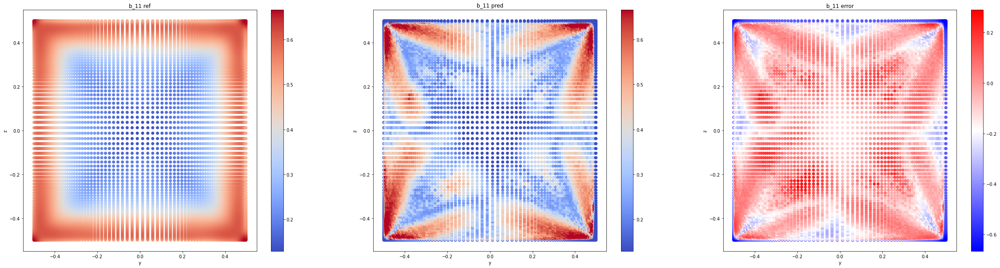

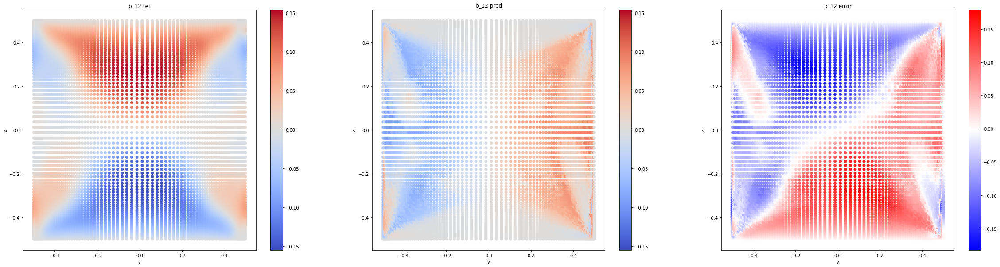

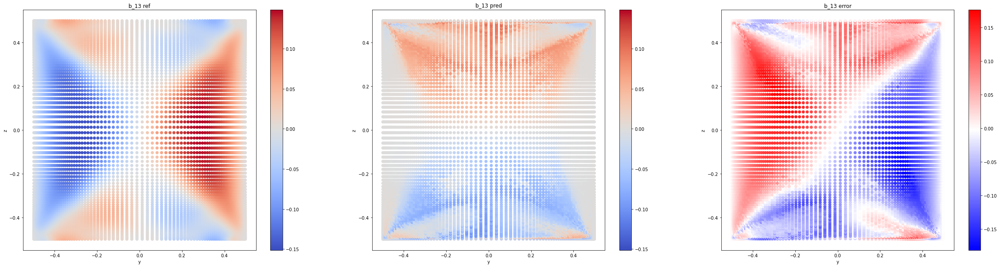

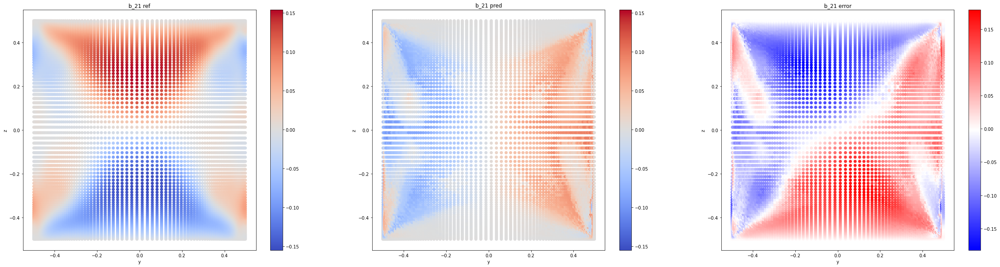

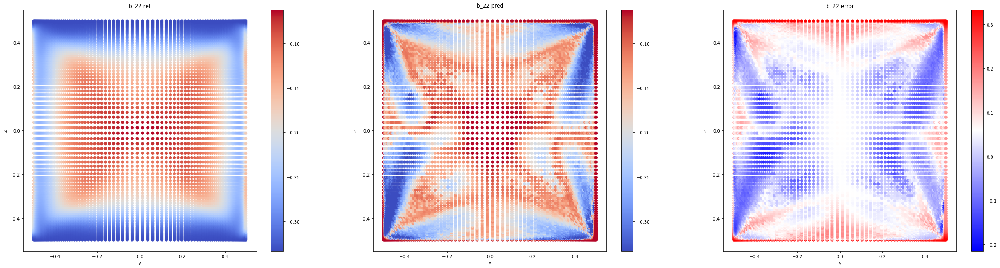

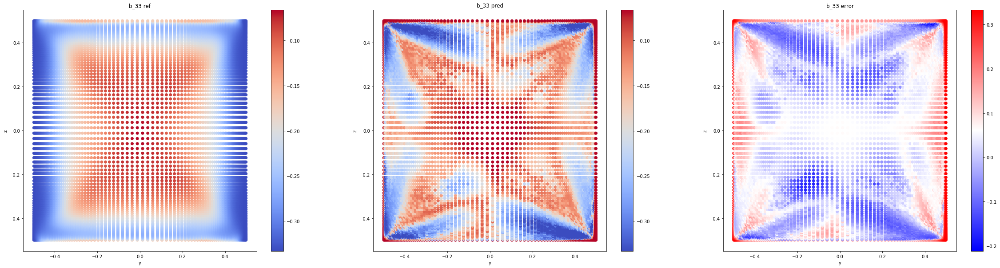

In [25]:
for i, j in ((0,0), (0,1), (0,2), (1,1), (1,2), (2,2)):
    fig = plt.figure(figsize=(40,10))
    ax = fig.add_subplot(1,3,1)
    sc = ax.scatter(y, z, c=b_test[:, i, j], cmap=cm.coolwarm, vmin=b_test[:, i, j].min(), vmax=b_test[:, i, j].max())
    ax.set_title(f'b_{i+1}{j+1} ref')
    ax.set_xlabel('y')
    ax.set_ylabel('z')
    fig.colorbar(sc, ax=ax)

    ax = fig.add_subplot(1,3,2)
    sc = ax.scatter(y, z, c=b_pred[:, i, j], cmap=cm.coolwarm, vmin=b_test[:, i, j].min(), vmax=b_test[:, i, j].max())
    ax.set_title(f'b_{i+1}{j+1} pred')
    ax.set_xlabel('y')
    ax.set_ylabel('z')
    fig.colorbar(sc, ax=ax)
    
    error = b_pred[:, i, j] - b_test[:, i, j]
    ax = fig.add_subplot(1,3,3)
    sc = ax.scatter(y, z, c=error, cmap='bwr', vmin=np.min(error), vmax=np.max(error))
    ax.set_title(f'b_{i+1}{j+1} error')
    ax.set_xlabel('y')
    ax.set_ylabel('z')
    fig.colorbar(sc, ax=ax)
    
    plt.savefig(f'../plots/{test_case}_TBNN_b{i+1}{j+1}.png', bbox_inches='tight')

    plt.show()

## 2. PHLL_case_1p2

In [26]:
test_case = 'PHLL_case_1p2'

test_tensors = loadCombinedArray([test_case],'Tensors')
test_invariants = loadCombinedArray([test_case],'I1')
test_features = test_invariants.copy()
test_features = scaler.transform(test_features)

b_test = loadLabels([test_case],'b')
b_pred = model([test_features, test_tensors])

In [27]:
x  = np.load(f'../data/{dataset}/{dataset}_{test_case}_Cx.npy')
y  = np.load(f'../data/{dataset}/{dataset}_{test_case}_Cy.npy')
z  = np.load(f'../data/{dataset}/{dataset}_{test_case}_Cz.npy')

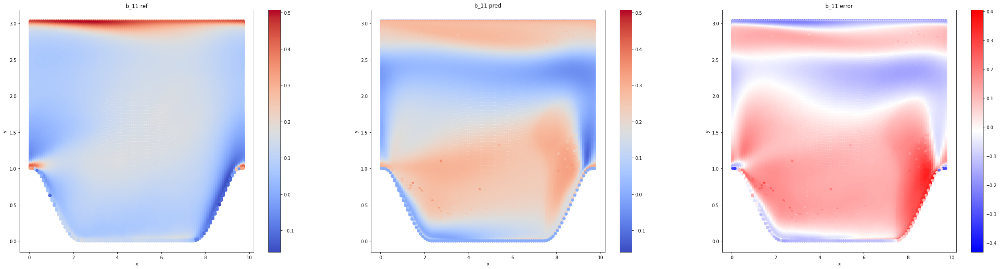

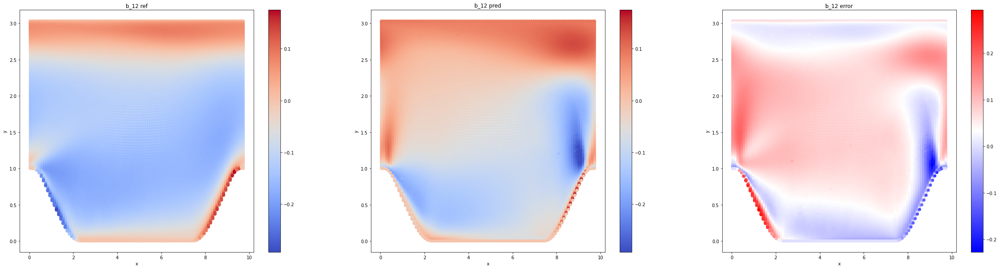

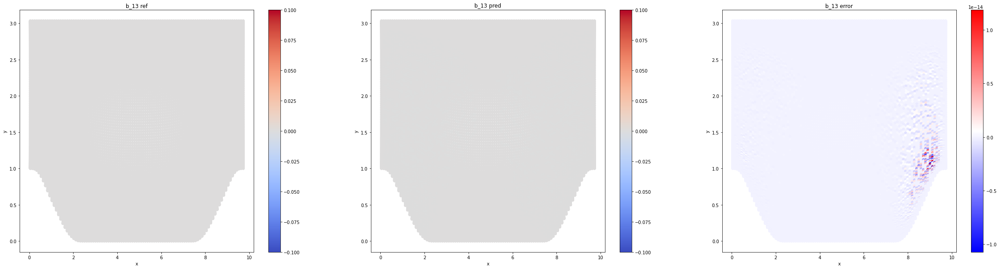

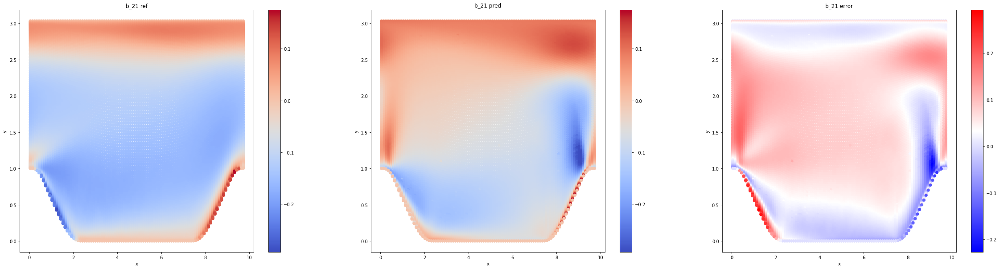

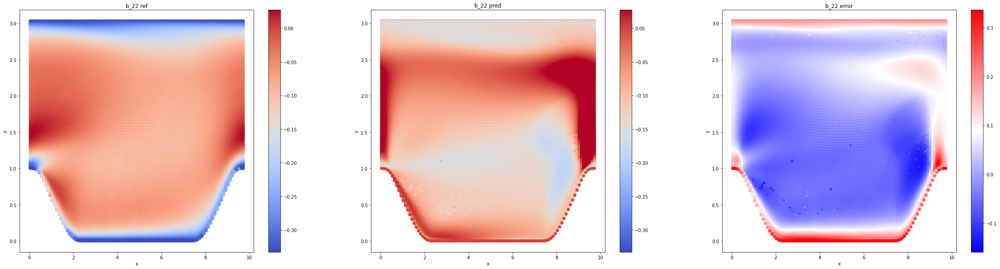

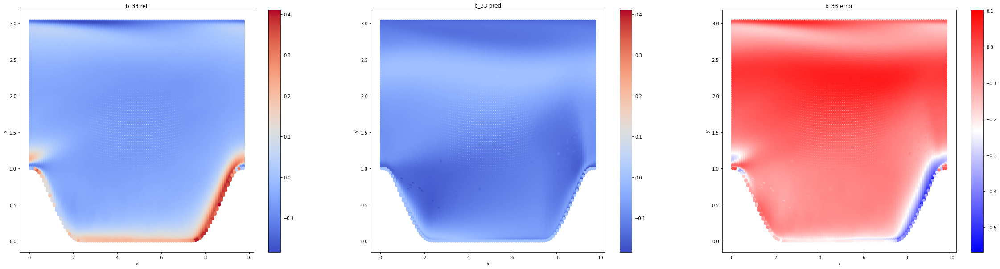

In [28]:
for i, j in ((0,0), (0,1), (0,2), (1,1), (1,2), (2,2)):
    fig = plt.figure(figsize=(40,10))
    ax = fig.add_subplot(1,3,1)
    sc = ax.scatter(x, y, c=b_test[:, i, j], cmap=cm.coolwarm, vmin=b_test[:, i, j].min(), vmax=b_test[:, i, j].max())
    ax.set_title(f'b_{i+1}{j+1} ref')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    fig.colorbar(sc, ax=ax)

    ax = fig.add_subplot(1,3,2)
    sc = ax.scatter(x, y, c=b_pred[:, i, j], cmap=cm.coolwarm, vmin=b_test[:, i, j].min(), vmax=b_test[:, i, j].max())
    ax.set_title(f'b_{i+1}{j+1} pred')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    fig.colorbar(sc, ax=ax)
    
    error = b_pred[:, i, j] - b_test[:, i, j]
    ax = fig.add_subplot(1,3,3)
    sc = ax.scatter(x, y, c=error, cmap='bwr', vmin=np.min(error), vmax=np.max(error))
    ax.set_title(f'b_{i+1}{j+1} error')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    fig.colorbar(sc, ax=ax)
    
    plt.savefig(f'../plots/{test_case}_TBNN_b{i+1}{j+1}.png', bbox_inches='tight')

    plt.show()

## 3. BUMP_h38

In [29]:
test_case = 'BUMP_h38'

test_tensors = loadCombinedArray([test_case],'Tensors')
test_invariants = loadCombinedArray([test_case],'I1')
test_features = test_invariants.copy()
test_features = scaler.transform(test_features)

b_test = loadLabels([test_case],'b')
b_pred = model([test_features, test_tensors])

In [30]:
x  = np.load(f'../data/{dataset}/{dataset}_{test_case}_Cx.npy')
y  = np.load(f'../data/{dataset}/{dataset}_{test_case}_Cy.npy')
z  = np.load(f'../data/{dataset}/{dataset}_{test_case}_Cz.npy')

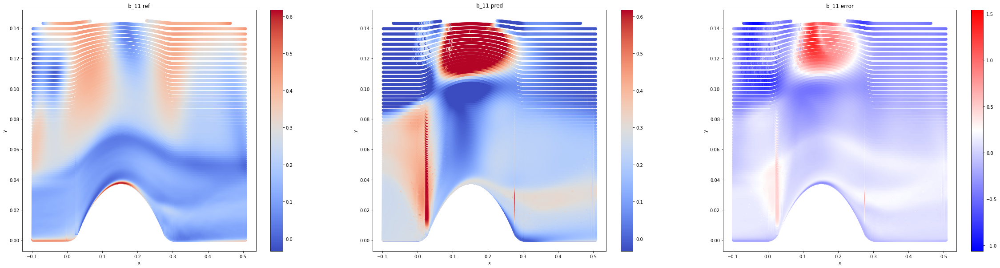

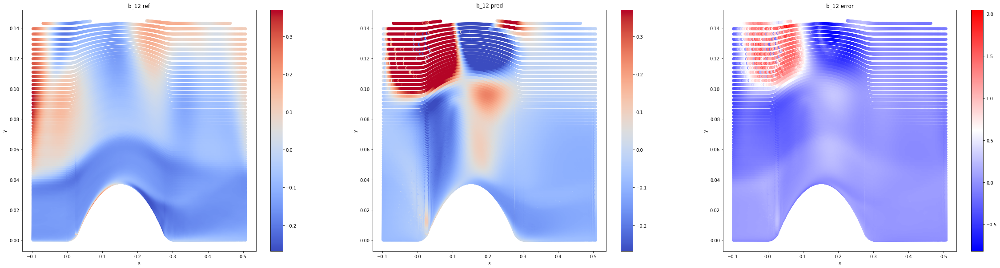

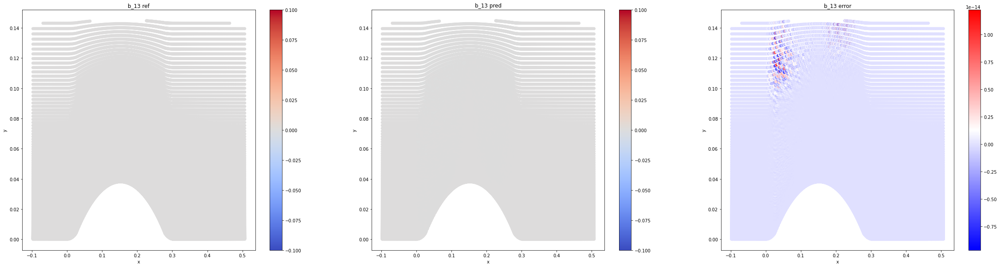

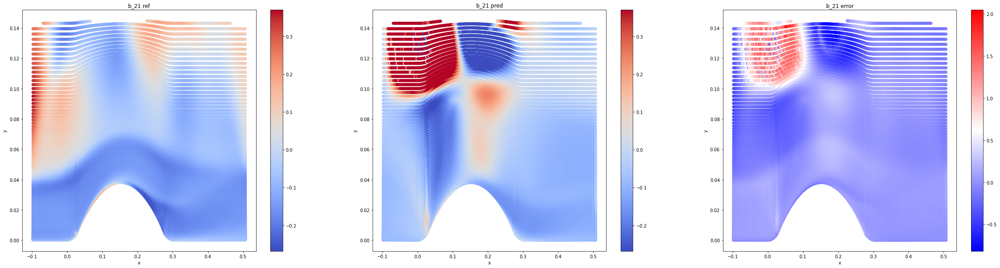

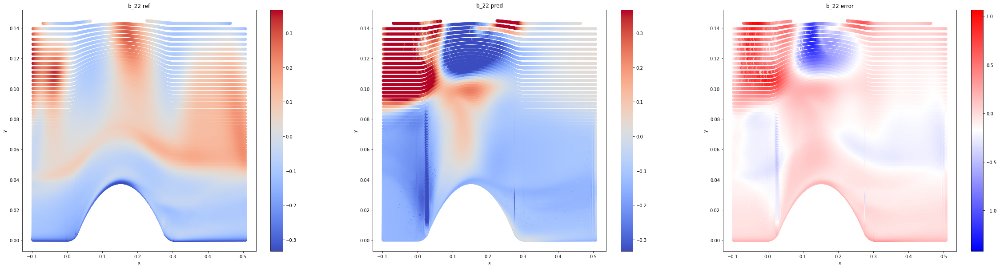

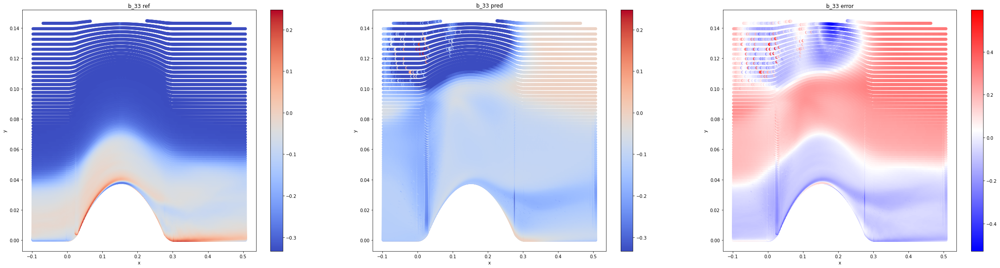

In [31]:
for i, j in ((0,0), (0,1), (0,2), (1,1), (1,2), (2,2)):
    fig = plt.figure(figsize=(40,10))
    ax = fig.add_subplot(1,3,1)
    sc = ax.scatter(x, y, c=b_test[:, i, j], cmap=cm.coolwarm, vmin=b_test[:, i, j].min(), vmax=b_test[:, i, j].max())
    ax.set_title(f'b_{i+1}{j+1} ref')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    fig.colorbar(sc, ax=ax)

    ax = fig.add_subplot(1,3,2)
    sc = ax.scatter(x, y, c=b_pred[:, i, j], cmap=cm.coolwarm, vmin=b_test[:, i, j].min(), vmax=b_test[:, i, j].max())
    ax.set_title(f'b_{i+1}{j+1} pred')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    fig.colorbar(sc, ax=ax)
    
    error = b_pred[:, i, j] - b_test[:, i, j]
    ax = fig.add_subplot(1,3,3)
    sc = ax.scatter(x, y, c=error, cmap='bwr', vmin=np.min(error), vmax=np.max(error))
    ax.set_title(f'b_{i+1}{j+1} error')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    fig.colorbar(sc, ax=ax)
    
    plt.savefig(f'../plots/{test_case}_TBNN_b{i+1}{j+1}.png', bbox_inches='tight')

    plt.show()